### Configuering libs and data

In [1]:
## Standard libraries
import os
import math
import numpy as np
import pandas as pd
from collections import defaultdict

## Imports for plotting
import matplotlib.pyplot as plt
plt.set_cmap('cividis')
import seaborn as sns

## Progress bar
from tqdm.notebook import tqdm

## PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data
import torch.optim as optim
# Torchvision
import torchvision
from torchvision.datasets import MNIST
from torchvision import transforms

# Path to the folder where the datasets are/should be downloaded (e.g. MNIST)
DATASET_PATH = "../data"

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# Fetching the device that will be used throughout this notebook
device = torch.device("cpu") if not torch.cuda.is_available() else torch.device("cuda")
print("Using device", device)

Using device cuda


<Figure size 640x480 with 0 Axes>

In [2]:
!pip install geomloss

  Preparing metadata (setup.py) ... done
  Created wheel for geomloss: filename=geomloss-0.2.6-py3-none-any.whl size=32247 sha256=c930b38fe9aad893ed8209bbce6b992e3da4c314a500fc23b255cf922acd4eb2
  Stored in directory: /root/.cache/pip/wheels/8c/4a/93/91d962ed04d2358b07000fb21b3164fd167b1b9cfddfce67fd
Successfully built geomloss


In [3]:
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

# Seting DIR
DIR = "/content/drive/My Drive/Project CVLAB/training_bad"
os.makedirs(DIR, exist_ok=True)

Mounted at /content/drive


In [4]:
def scale(sample):
    return 2 * sample - 1

# Transformations applied on each image => only make them a tensor
transform = transforms.Compose([transforms.ToTensor(), scale])

# Loading the training dataset. We need to split it into a training and validation part
train_dataset = MNIST(root=DATASET_PATH, train=True, transform=transform, download=True)

train_set, val_set = torch.utils.data.random_split(train_dataset, [50000, 10000])

# Loading the test set
test_set = MNIST(root=DATASET_PATH, train=False, transform=transform, download=True)

# We define a set of data loaders that we can use for various purposes later.
train_loader = data.DataLoader(train_set, batch_size=128, shuffle=True,  drop_last=True)
val_loader   = data.DataLoader(val_set,   batch_size=128, shuffle=False, drop_last=True)
test_loader  = data.DataLoader(test_set,  batch_size=128, shuffle=False, drop_last=True)

print('Train size:', len(train_loader.dataset))
print('Validation size:', len(val_loader.dataset))
print('Test size:', len(test_loader.dataset))

100%|██████████| 9.91M/9.91M [00:00<00:00, 12.4MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 360kB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 3.21MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 12.4MB/s]

Train size: 50000
Validation size: 10000
Test size: 10000


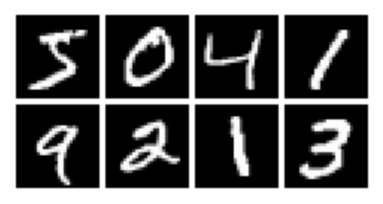

In [5]:
def show_tensor_image(img):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: torch.minimum(torch.tensor([1]), t)),
        transforms.Lambda(lambda t: torch.maximum(torch.tensor([0]), t)),
        transforms.ToPILImage(),
    ])
    plt.imshow(reverse_transforms(img))


def show_imgs(imgs, nrows=1):
    ncols = len(imgs) // nrows

    imgs = torch.stack(imgs) if isinstance(imgs, list) else imgs        # T, img, ch, size, size or img, ch, size, size

    imgs = imgs.unsqueeze(0) if imgs.ndim == 4 else imgs                # T, img, ch, size, size
    imgs = imgs.transpose(1, 0)                                         # img, T, ch, size, size
    imgs = imgs.reshape((-1,) + imgs.shape[2:])                         # img * T, ch, size, size

    plt.figure(figsize=(ncols * 1.2, nrows * 1.2))
    grid = torchvision.utils.make_grid(imgs.cpu(), nrow=ncols, pad_value=128)
    show_tensor_image(grid.detach().cpu())

    plt.axis('off')
    plt.show()
    plt.close()

show_imgs([train_dataset[i][0] for i in range(8)], nrows=2)

### model componenets

In [6]:
class EmbedBlock(nn.Module):
    def __init__(self, input_dim, emb_dim):
        super(EmbedBlock, self).__init__()
        self.input_dim = input_dim
        layers = [
            nn.Linear(input_dim, emb_dim * 2),  # wider
            nn.ReLU(),
            nn.Linear(emb_dim * 2, emb_dim),
            nn.Unflatten(1, (emb_dim, 1, 1)),
        ]
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        x = x.view(-1, self.input_dim)
        return self.model(x)

class SinusoidalPositionEmbedBlock(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings

class DownBlock(nn.Module):
    def __init__(self, in_chs, out_chs):
        super().__init__()
        self.model = nn.Sequential(
            nn.Conv2d(in_chs, out_chs, 3, 1, 1),
            nn.BatchNorm2d(out_chs),
            nn.ReLU(),
            nn.Conv2d(out_chs, out_chs, 3, 1, 1),
            nn.BatchNorm2d(out_chs),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )

    def forward(self, x):
        return self.model(x)

class UpBlock(nn.Module):
    def __init__(self, in_chs, out_chs):
        super().__init__()
        self.model = nn.Sequential(
            nn.ConvTranspose2d(2 * in_chs, out_chs, 3, 2, 1, 1),
            nn.BatchNorm2d(out_chs),
            nn.ReLU(),
            nn.Conv2d(out_chs, out_chs, 3, 1, 1),
            nn.BatchNorm2d(out_chs),
            nn.ReLU()
        )

    def forward(self, x, skip):
        x = torch.cat((x, skip), 1)
        x = self.model(x)
        return x

In [7]:
class UNet(nn.Module):
    def __init__(self, T, img_shape):
        super(UNet, self).__init__()
        self.T = T

        img_chs = img_shape[0]
        down_chs = (52, 96, 96)
        up_chs = down_chs[::-1]
        latent_image_size = img_shape[1] // 4

        t_embed_dim = 14
        dense_hidden = 72

        # Initial convolution
        self.down0 = nn.Sequential(
            nn.Conv2d(img_chs, down_chs[0], 3, padding=1),
            nn.BatchNorm2d(down_chs[0]),
            nn.ReLU()
        )

        # Downsample
        self.down1 = DownBlock(down_chs[0], down_chs[1])
        self.down2 = DownBlock(down_chs[1], down_chs[2])
        self.to_vec = nn.Sequential(nn.Flatten(), nn.ReLU())

        # Dense embedding
        self.dense_emb = nn.Sequential(
            nn.Linear(down_chs[2]*latent_image_size**2, dense_hidden),
            nn.ReLU(),
            nn.Linear(dense_hidden, dense_hidden),
            nn.ReLU(),
            nn.Linear(dense_hidden, down_chs[2]*latent_image_size**2),
            nn.ReLU()
        )

        # Time embeddings
        self.sinusoidaltime = SinusoidalPositionEmbedBlock(t_embed_dim)
        self.temb_1 = EmbedBlock(t_embed_dim, up_chs[0])
        self.temb_2 = EmbedBlock(t_embed_dim, up_chs[1])

        # Upsample
        self.up0 = nn.Sequential(
            nn.Unflatten(1, (up_chs[0], latent_image_size, latent_image_size)),
            nn.Conv2d(up_chs[0], up_chs[0], 3, padding=1),
            nn.BatchNorm2d(up_chs[0]),
            nn.ReLU(),
        )
        self.up1 = UpBlock(up_chs[0], up_chs[1])
        self.up2 = UpBlock(up_chs[1], up_chs[2])

        # Output
        self.out = nn.Sequential(
            nn.Conv2d(2 * up_chs[2], up_chs[2], 3, 1, 1),
            nn.BatchNorm2d(up_chs[-1]),
            nn.ReLU(),
            nn.Conv2d(up_chs[-1], img_chs, 3, 1, 1)
        )

    def forward(self, x, t):
        # normalize timestep
        norm_t = t.float() / float(self.T)

        # down
        down_0 = self.down0(x)
        down_1 = self.down1(down_0)
        down_2 = self.down2(down_1)

        # latent
        latent = self.to_vec(down_2)
        latent = self.dense_emb(latent)

        # time embeddings
        time = self.sinusoidaltime(norm_t)
        time_1 = self.temb_1(time)
        time_2 = self.temb_2(time)

        # up
        up_0 = self.up0(latent) + time_1
        up_1 = self.up1(up_0, down_2) + time_2
        up_2 = self.up2(up_1, down_1)
        out = self.out(torch.cat((up_2, down_0), 1))
        return out


In [8]:
class SimpleMNISTFeatureNet(nn.Module):
    def __init__(self, latent_dim=128):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(1, 96, 3, 1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(96, 192, 3, 1),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(192, 384, 3, 1, padding=1),
            nn.ReLU()
        )
        self.flatten = nn.Flatten()
        self.fc_feat = nn.Linear(384*5*5, latent_dim)
        self.fc_out  = nn.Linear(latent_dim, 10)

    def forward(self, x):
        x = self.conv(x)
        x = self.flatten(x)
        feat = F.relu(self.fc_feat(x))
        out = self.fc_out(feat)
        return out, feat

state_dict = torch.load(os.path.join(DIR, "EncoderNEW.pth"), map_location=device)
new_state_dict = {k.replace('_orig_mod.', ''): v for k, v in state_dict.items()}

netEncoder = SimpleMNISTFeatureNet()
netEncoder.load_state_dict(new_state_dict)
netEncoder.to(device)

SimpleMNISTFeatureNet(
  (conv): Sequential(
    (0): Conv2d(1, 96, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(96, 192, kernel_size=(3, 3), stride=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU()
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (fc_feat): Linear(in_features=9600, out_features=128, bias=True)
  (fc_out): Linear(in_features=128, out_features=10, bias=True)
)

In [9]:
from geomloss import SamplesLoss
from math import sqrt
import random
reg = 0.1
compute_ot_cost = SamplesLoss(
                "sinkhorn",
                p=2,
                blur=sqrt(reg),
                debias=False,
                backend="tensorized"
            )

### model

In [10]:
class DDPM(nn.Module):
    def __init__(self, T, img_shape, method='cosine'):
        super(DDPM, self).__init__()
        self.T = T

        epsilon=0.008
        if method == 'cosine':
            steps=torch.linspace(0,T,steps=T+1).to(device)
            f_t=torch.cos(((steps/T+epsilon)/(1.0+epsilon))*math.pi*0.5)**2
            self.Beta = torch.clip(1.0-f_t[1:]/f_t[:T], 0.0, 0.999)

        elif method == 'linear':
            self.Beta = torch.linspace(1e-4, 2e-2, T).to(device)

        # Forward diffusion variables
        self.a = 1.0 - self.Beta
        self.a_bar = torch.cumprod(self.a, dim=0)

        self.img_chs = img_shape[0]
        self.img_size = img_shape[1]

        self.net = UNet(T, img_shape)

        # Logging
        self.logs = defaultdict(list)

    def log(self, key, value):
        self.logs[key].append(value)

    def q(self, x_0, t):
        """
        Samples a new image from q
        Returns a tuple (img_after_noise, noise) at timestep t
        x_0: the original image
        t: timestep
        """

        # noise
        noise = torch.randn_like(x_0).to(device)

        #  scaling factors
        alpha_bar_t = self.a_bar[t]
        sqrt_ab = torch.sqrt(alpha_bar_t).reshape(-1, 1, 1, 1)
        sqrt_one_minus_ab = torch.sqrt(1 - alpha_bar_t).reshape(-1, 1, 1, 1)

        # forward diffusion formula
        scaled_x0 = sqrt_ab * x_0
        scaled_noise = sqrt_one_minus_ab * noise
        x_t = scaled_x0 + scaled_noise

        return x_t, noise



    def get_x0_pred(self, x_t, t, e_t):

        alpha_bar_t = self.a_bar[t].reshape(-1, 1, 1, 1)

        x_0_pred = (x_t - torch.sqrt(1 - alpha_bar_t) * e_t) / torch.sqrt(alpha_bar_t)
        x_0_pred = x_0_pred.clamp(-1, 1)
        return x_0_pred

    @torch.no_grad()
    def reverse_q(self, x_t, t, e_t):
        # parameters for timestep t
        alpha_t = self.a[t]
        alpha_bar_t = self.a_bar[t]
        beta_t = self.Beta[t]
        sigma_t = torch.sqrt(beta_t)

        # noise injection
        noise = torch.randn_like(x_t).to(device) if t > 0 else 0

        coef = (1 - alpha_t) / torch.sqrt(alpha_bar_t)
        denominator = torch.sqrt(alpha_t)
        x_denoised = x_t - coef * e_t
        x_prev = x_denoised / denominator + noise * sigma_t
        x_prev.clamp_(-1, 1)

        return x_prev


    def get_loss(self, x_0, t):
        """
        Returns the loss between the true noise and the predicted noise
        x_0: the original image
        t: timestep
        """
        # get mse loss
        x_t, true_noise = self.q(x_0, t)
        predicted_noise = self.net(x_t, t)
        loss_mse = F.mse_loss(predicted_noise, true_noise)

        # get x0 pred
        x0_pred = self.get_x0_pred(x_t, t, predicted_noise)

        # get x0 true
        n = 1000
        dataset = train_loader.dataset
        indices = random.sample(range(len(dataset)), n)
        x0_true = [dataset[i][0] for i in indices]
        x0_true = torch.stack(x0_true).to(device)

        # encode
        _, feat_pred = netEncoder(x0_pred)
        _, feat_true = netEncoder(x0_true)

        # get ot loss
        loss_ot = compute_ot_cost(feat_pred, feat_true)

        return loss_mse, loss_ot

    @torch.no_grad()
    def sample(self, num_imgs=1, skip=1):
        self.eval()

        x_t = torch.randn(num_imgs, self.img_chs, self.img_size, self.img_size).to(device)
        output = []

        # reverse diffusion loop
        for t in reversed(range(self.T)):
            t_batch = torch.full((num_imgs,), t, device=device)
            predicted_noise = self.net(x_t, t_batch)

            x_t = self.reverse_q(x_t, t, predicted_noise)
            output.append(x_t)

        return torch.stack(output)[::skip]      # output shape is (T,b,c,h,w)


    def log(self, key, value):
        self.logs[key].append(value)

    def training_step(self, batch):
        t = torch.randint(0, self.T, (len(batch),), device=device)
        loss_mse, loss_ot = self.get_loss(batch, t)
        loss = loss_mse + 0.00003*loss_ot

        # Log losses
        self.log('train_loss', loss.item())
        return loss

    @torch.no_grad()
    def validation_step(self, loader):
        loss_mse = 0
        loss_ot = 0
        for imgs, _ in tqdm(loader, leave=False):
          imgs = imgs.to(device)
          t = torch.randint(0, self.T, (len(imgs),), device=device)
          loss_mse_step, loss_ot_step = self.get_loss(imgs, t)
          loss_mse += loss_mse_step.item()
          loss_ot += loss_ot_step.item()

        print(f"mse : {loss_mse}")
        print(f"ot : {loss_ot}")
        loss = loss_mse + 0.00003*loss_ot
        loss = loss / len(loader)
        # Log losses
        self.log('val_loss', loss)
        return loss

    @torch.no_grad()
    def test_step(self, loader):
        loss_mse = 0
        loss_ot = 0
        for imgs, _ in tqdm(loader, leave=False):
          imgs = imgs.to(device)
          t = torch.randint(0, self.T, (len(imgs),), device=device)
          loss_mse_step, loss_ot_step = self.get_loss(imgs, t)
          loss_mse += loss_mse_step.item()
          loss_ot += loss_ot_step.item()

        print(f"mse : {loss_mse}")
        print(f"ot : {loss_ot}")
        loss = loss_mse + 0.00003*loss_ot
        loss = loss / len(loader)
        # Log losses
        self.log('test_loss', loss)
        return loss

### train

In [11]:
from torchsummary import summary

img_shape = train_set[0][0].shape
model = DDPM(T=1000, img_shape=img_shape)
print("Num params: {:,}".format(sum(p.numel() for p in model.parameters())))
model = torch.compile(model.to(device))

optimizer = optim.Adam(model.parameters(), lr=1e-3)
epochs = 30

DIR_MODEL = os.path.join(DIR, "models_mixed_0.1")
os.makedirs(DIR_MODEL, exist_ok=True)

Num params: 1,522,201


Training Epoch [1/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 6.05667070299387
ot : 64521.79022216797
Epoch 0 | Loss: 0.1024656975597296 
Save model


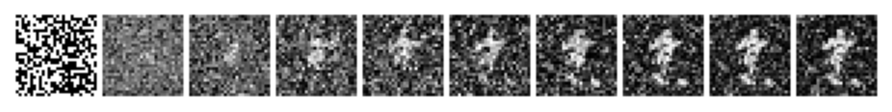

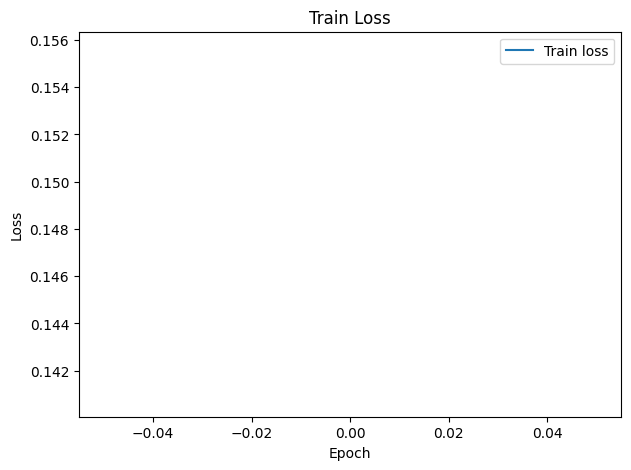

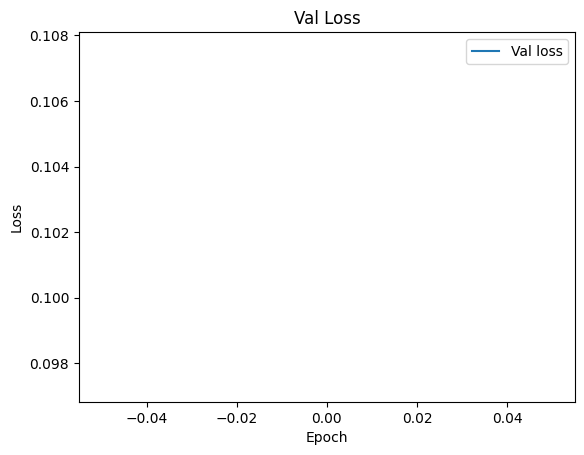

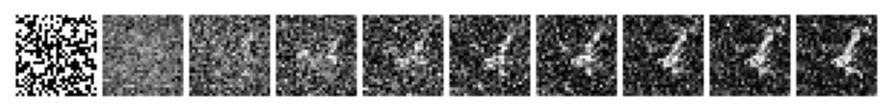

Training Epoch [2/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 5.305619351565838
ot : 59338.17059326172
Epoch 1 | Loss: 0.09084313422261141 
Save model


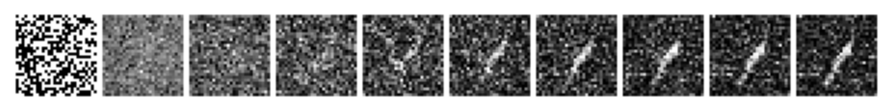

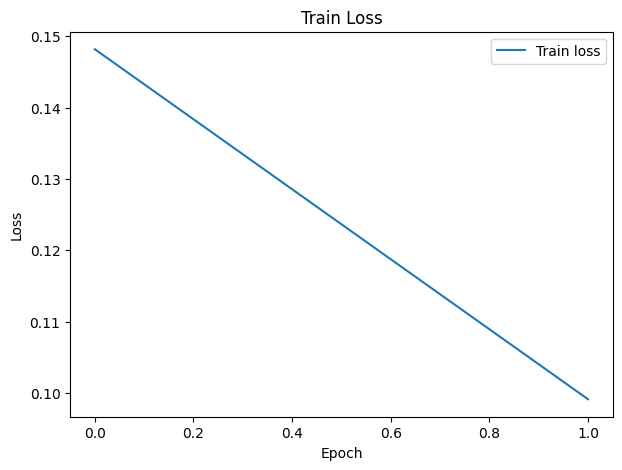

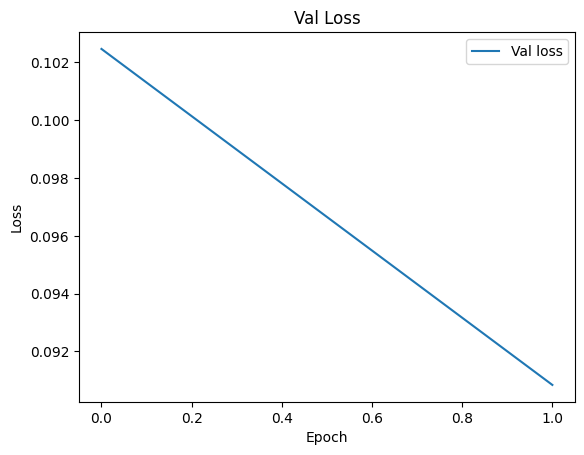

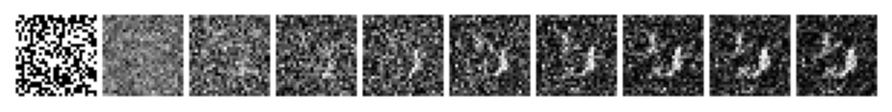

Training Epoch [3/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 5.008921753615141
ot : 54082.09533691406
Epoch 2 | Loss: 0.08501775145798159 
Save model


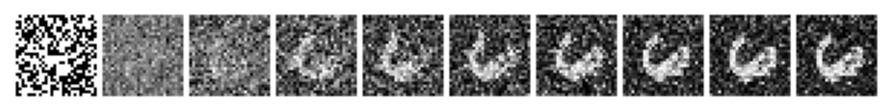

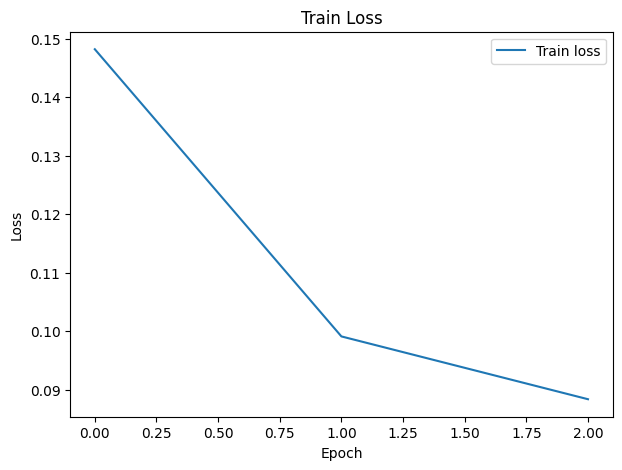

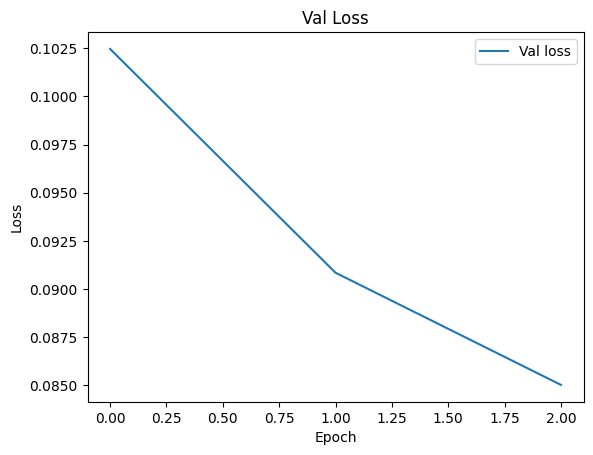

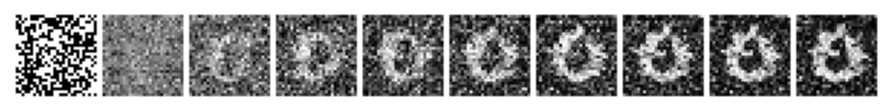

Training Epoch [4/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 4.73672578856349
ot : 52439.40167236328
Epoch 3 | Loss: 0.08089625434274857 
Save model


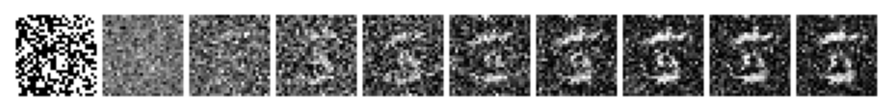

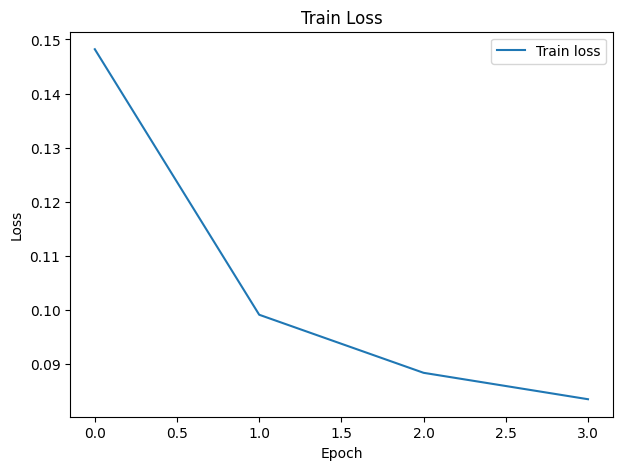

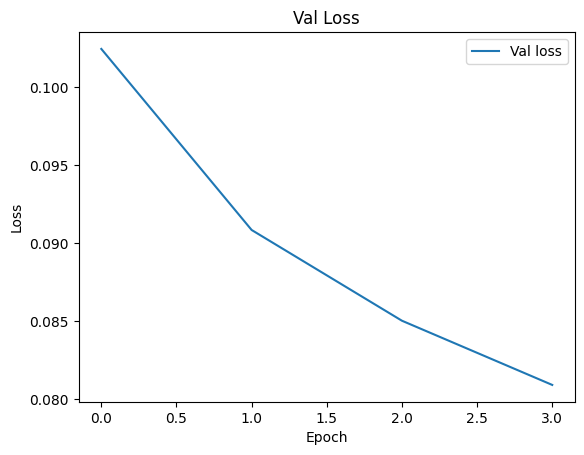

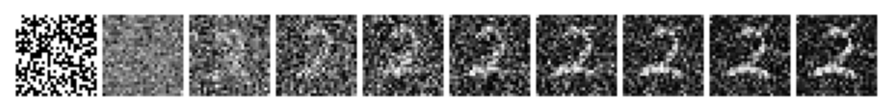

Training Epoch [5/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 4.825040191411972
ot : 52455.83947753906
Epoch 4 | Loss: 0.08203481250946339 
Save model


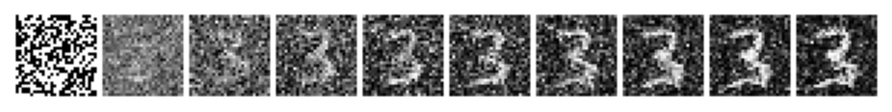

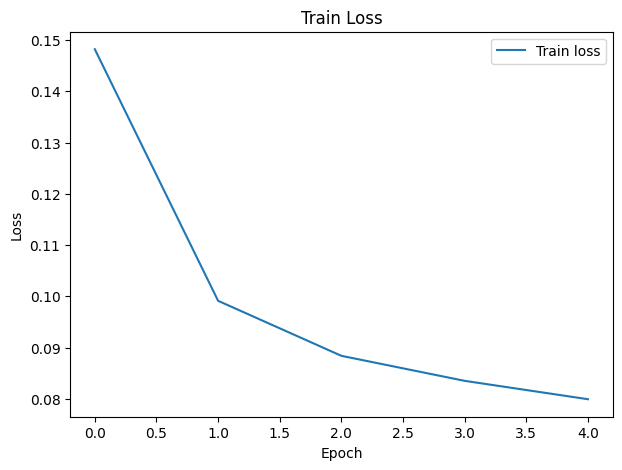

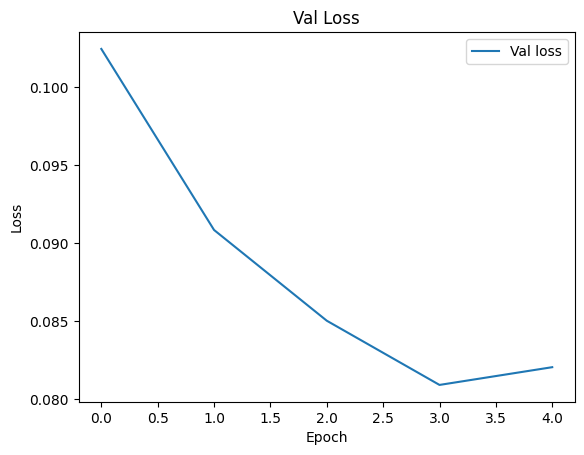

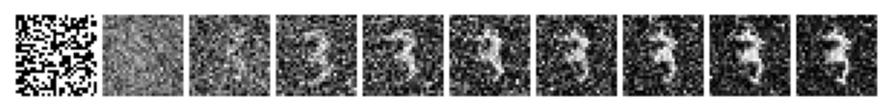

Training Epoch [6/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 4.740747135132551
ot : 52385.506896972656
Epoch 5 | Loss: 0.08092708130822732 
Save model


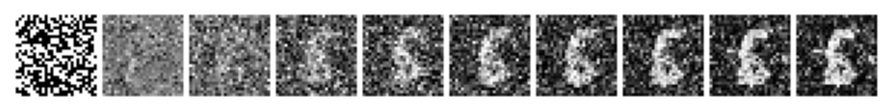

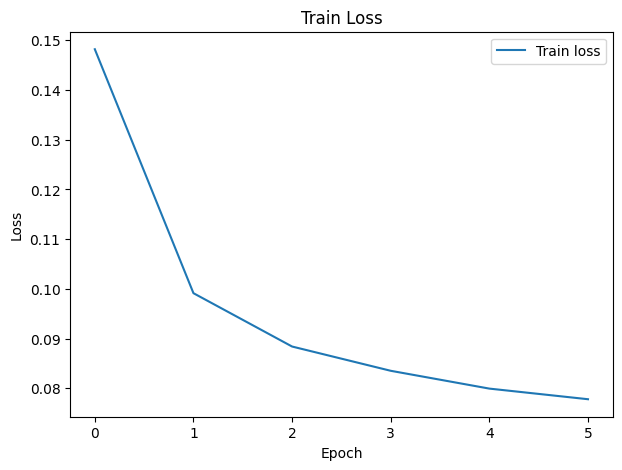

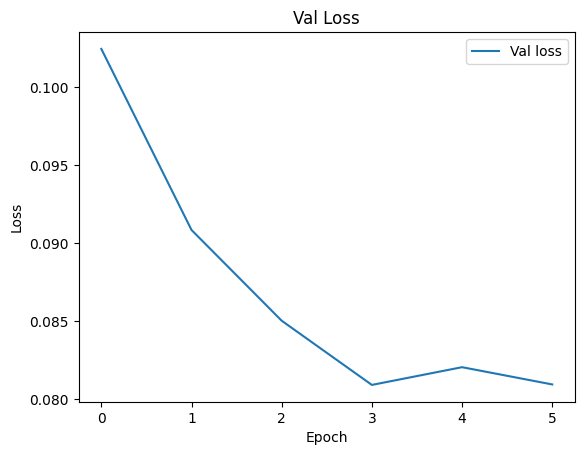

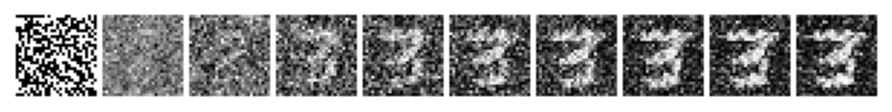

Training Epoch [7/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 4.2652334570884705
ot : 50893.562927246094
Epoch 6 | Loss: 0.074256927498793 
Save model


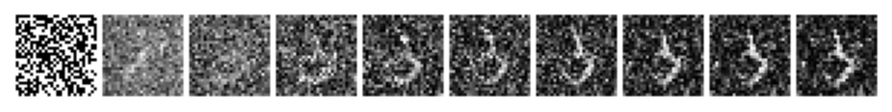

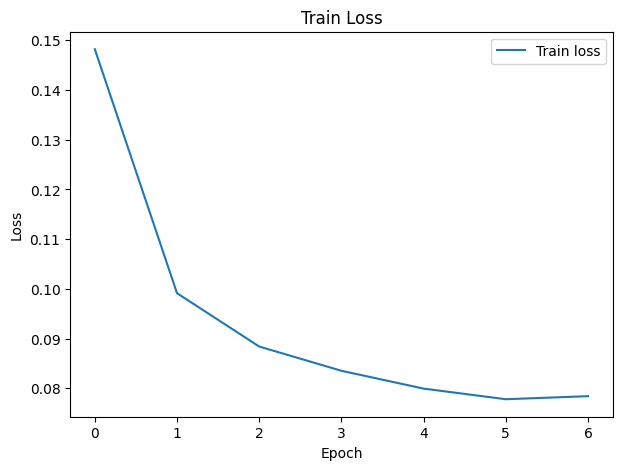

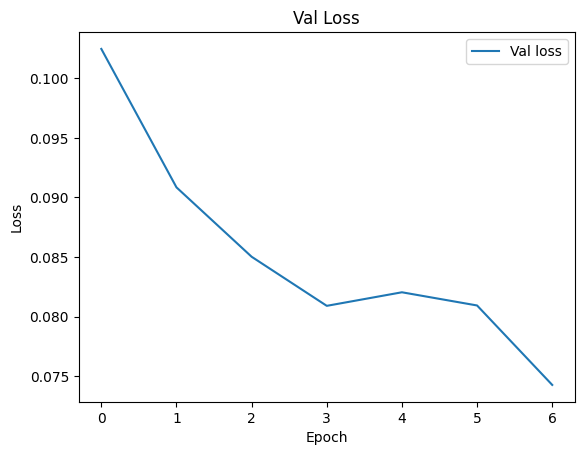

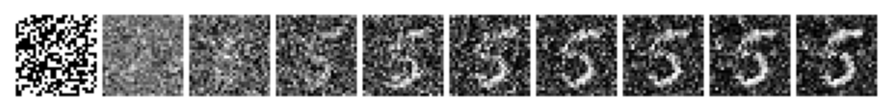

Training Epoch [8/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 4.235940098762512
ot : 51341.81799316406
Epoch 7 | Loss: 0.074053777417403 
Save model


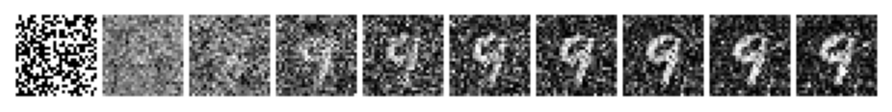

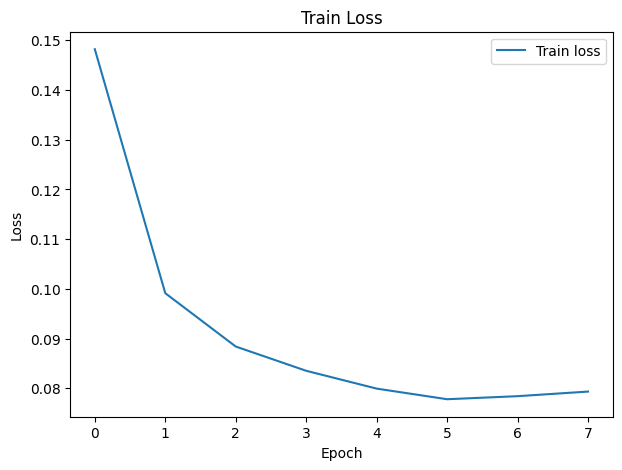

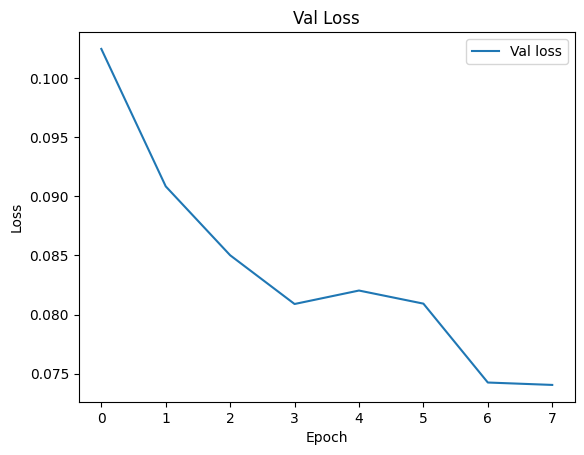

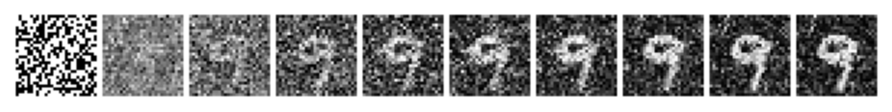

Training Epoch [9/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 4.24306246638298
ot : 51549.08514404297
Epoch 8 | Loss: 0.07422480795774704 
Save model


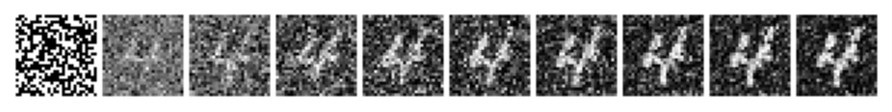

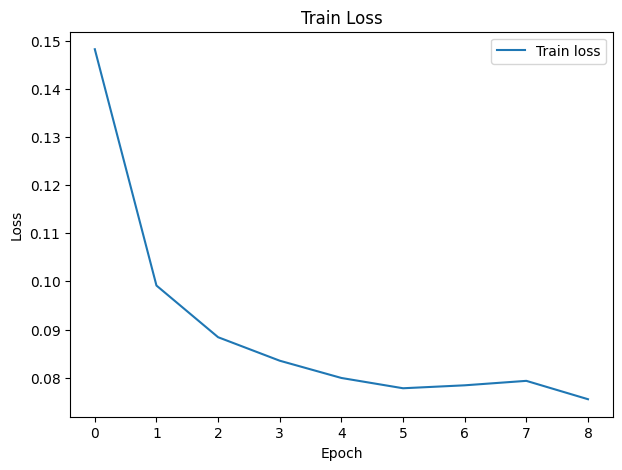

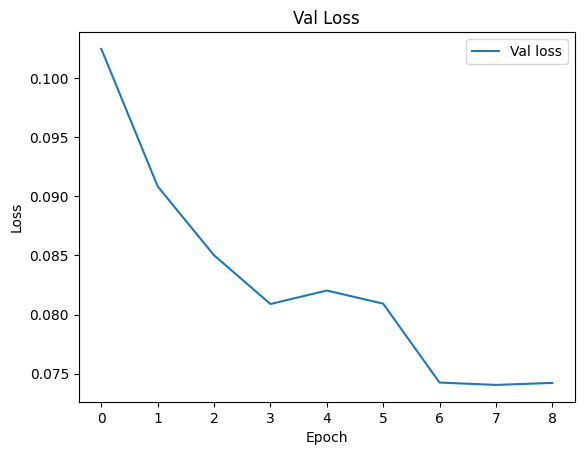

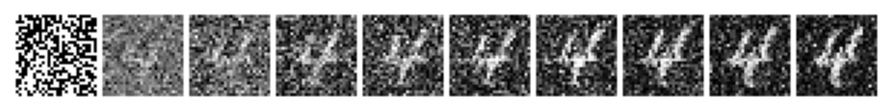

Training Epoch [10/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 4.082904618233442
ot : 50159.465576171875
Epoch 9 | Loss: 0.07163703314767435 
Save model


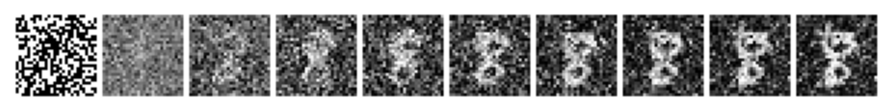

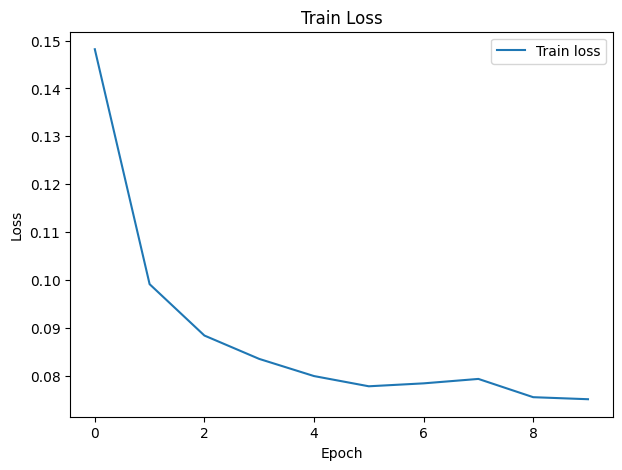

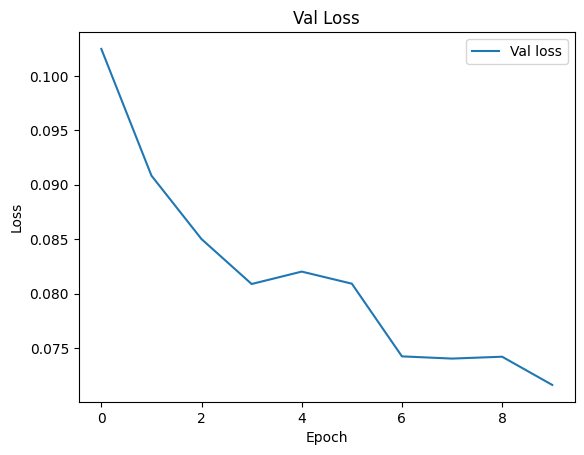

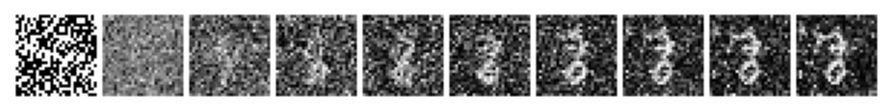

Training Epoch [11/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 4.8197865672409534
ot : 56070.50714111328
Epoch 10 | Loss: 0.08335771514710708 
Save model


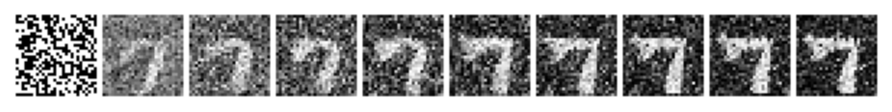

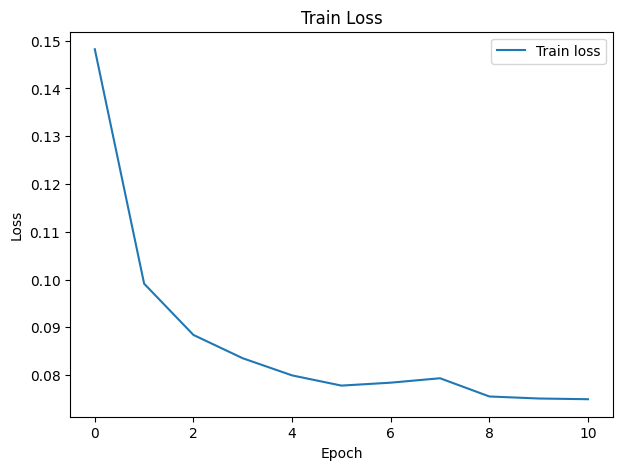

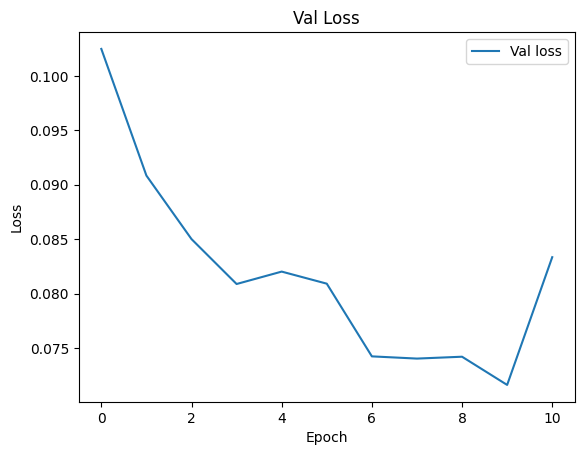

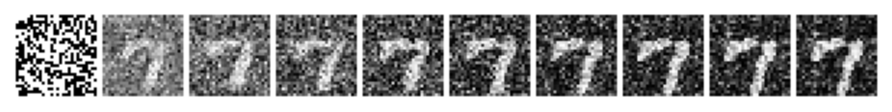

Training Epoch [12/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 3.985059291124344
ot : 50324.64465332031
Epoch 11 | Loss: 0.07044613629133274 
Save model


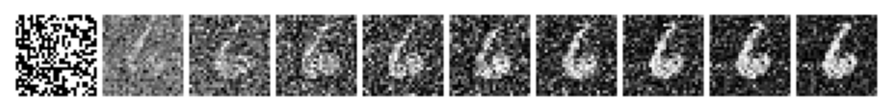

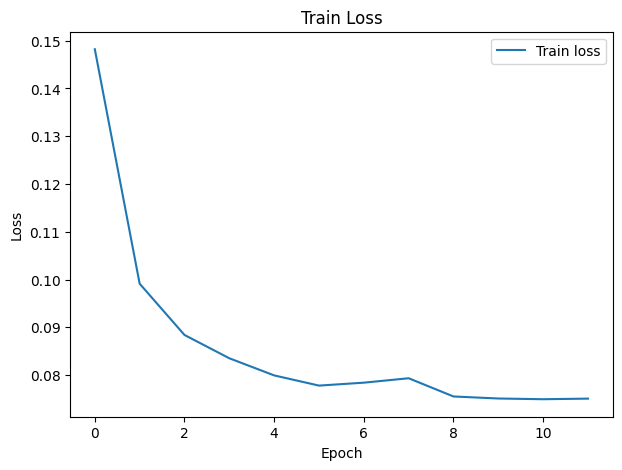

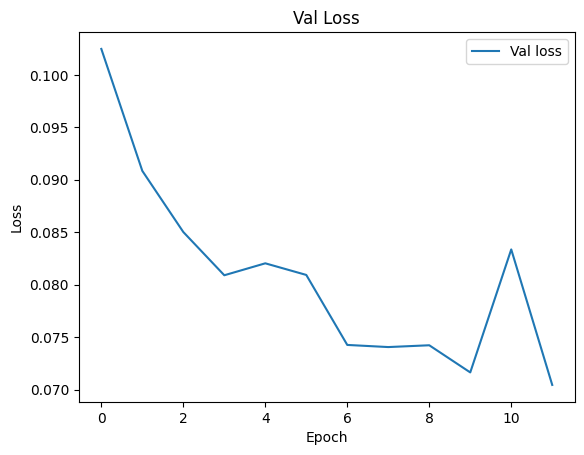

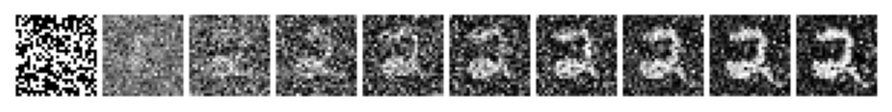

Training Epoch [13/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 4.021346855908632
ot : 49338.566162109375
Epoch 12 | Loss: 0.07053210052271684 
Save model


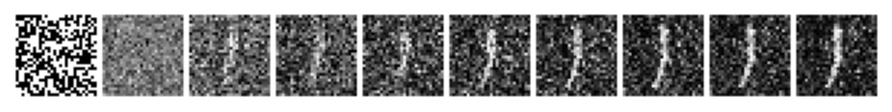

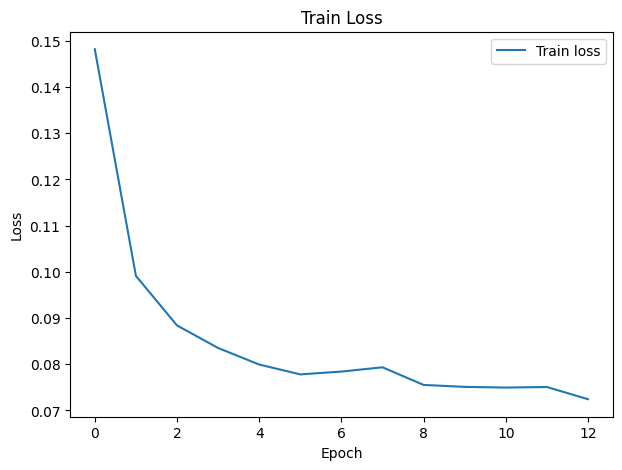

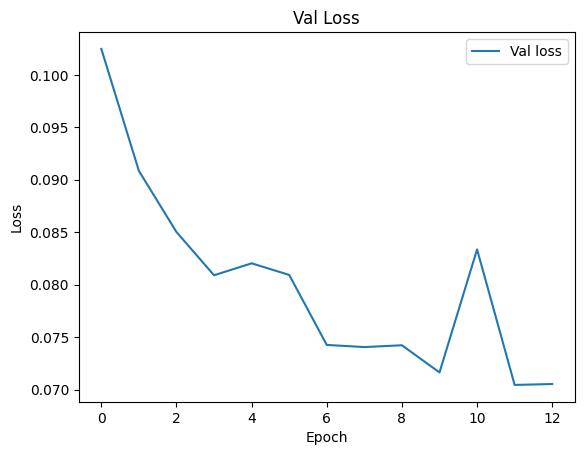

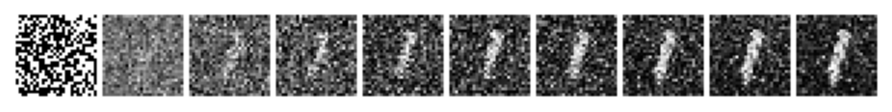

Training Epoch [14/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 3.9474474228918552
ot : 50108.355407714844
Epoch 13 | Loss: 0.06988074468106796 
Save model


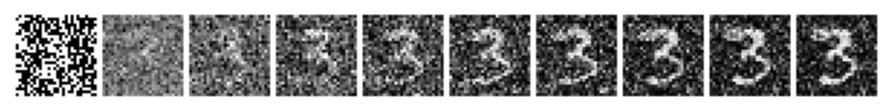

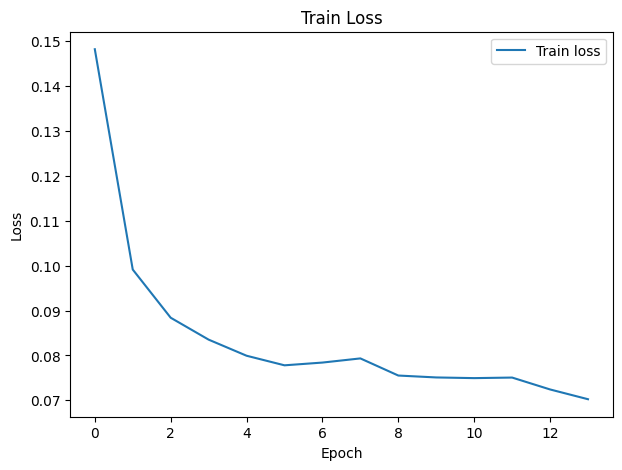

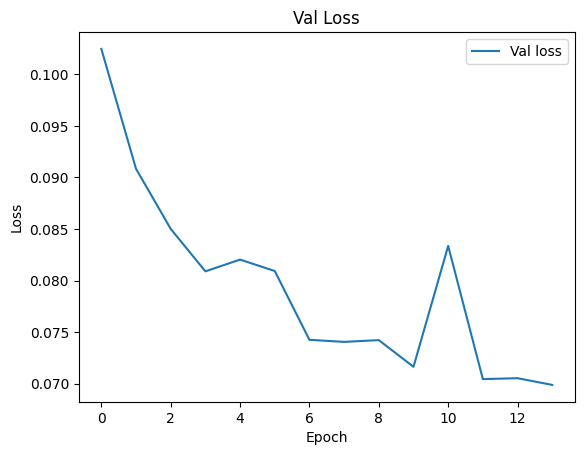

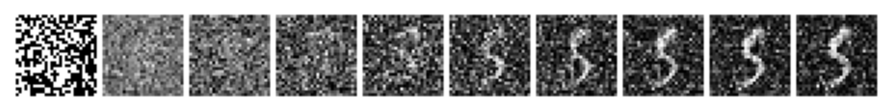

Training Epoch [15/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 3.860544178634882
ot : 49037.17858886719
Epoch 14 | Loss: 0.06835460943975509 
Save model


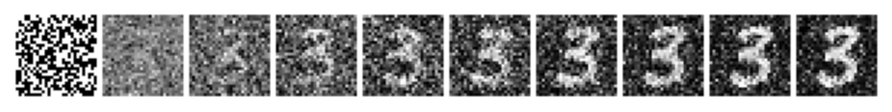

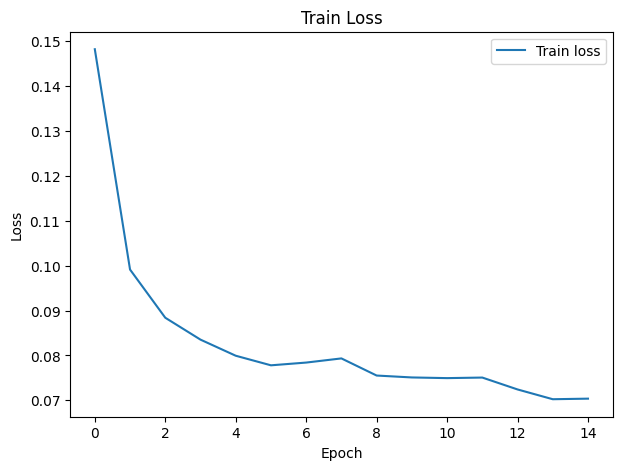

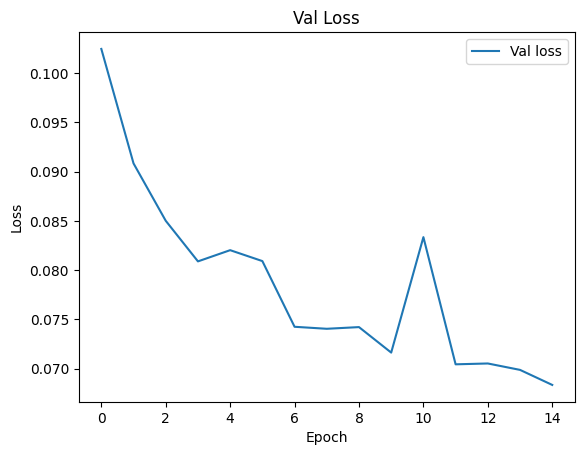

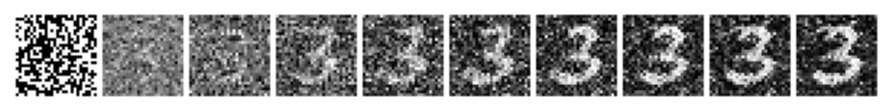

Training Epoch [16/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 3.90875006839633
ot : 50621.248107910156
Epoch 15 | Loss: 0.06958189117479019 
Save model


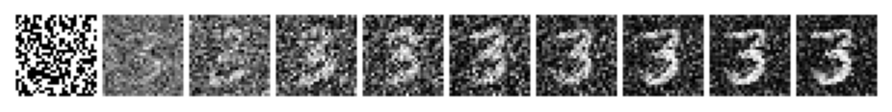

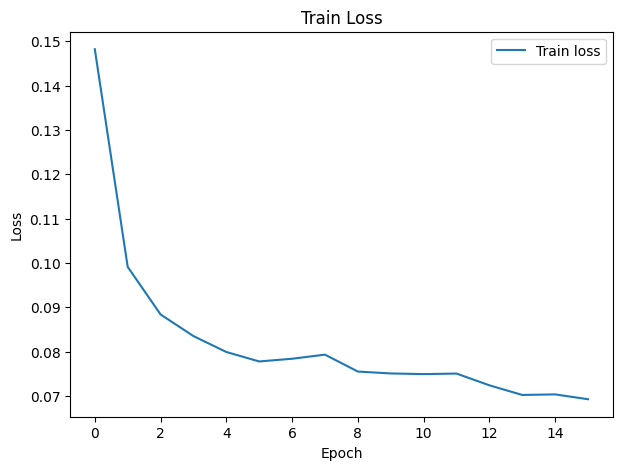

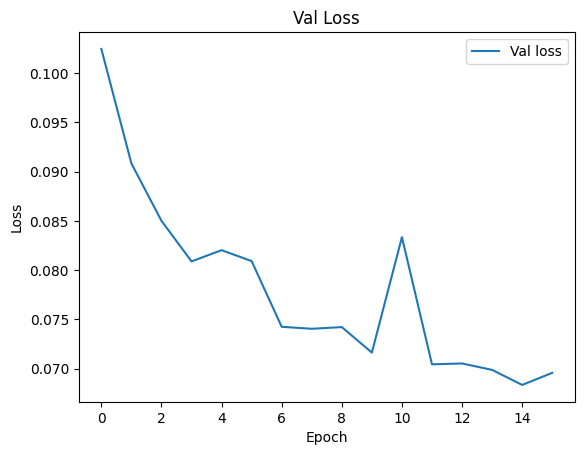

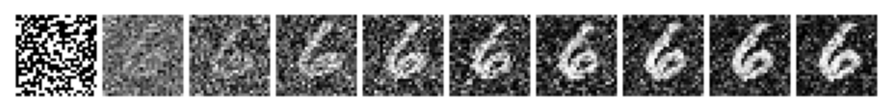

Training Epoch [17/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 3.8131333962082863
ot : 48644.305725097656
Epoch 16 | Loss: 0.06759567394822072 
Save model


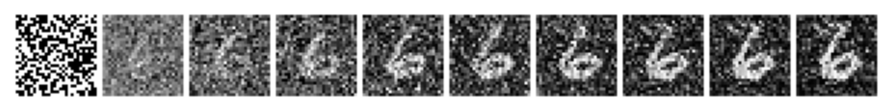

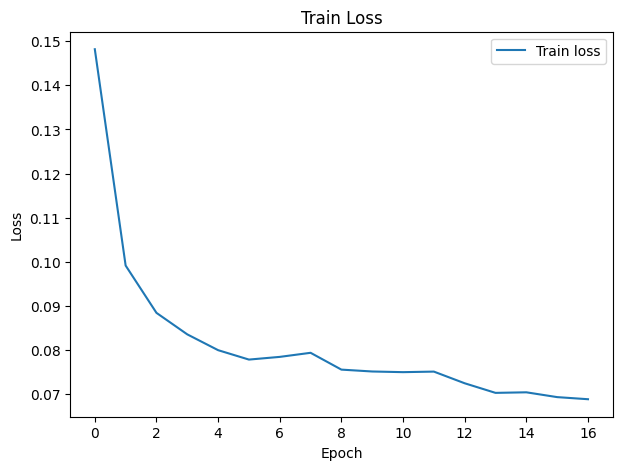

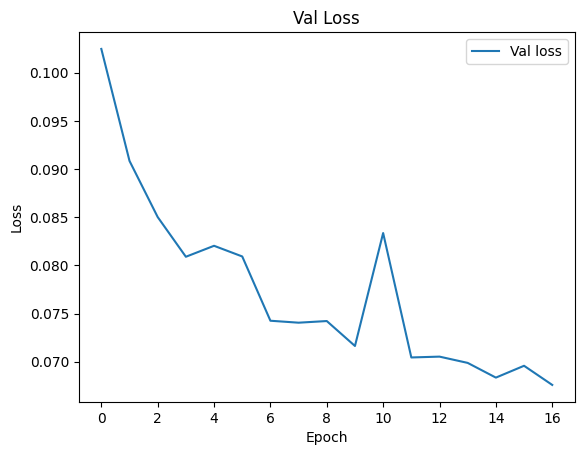

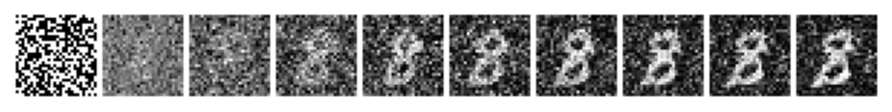

Training Epoch [18/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 3.6831225343048573
ot : 50443.812744140625
Epoch 17 | Loss: 0.06662098611062918 
Save model


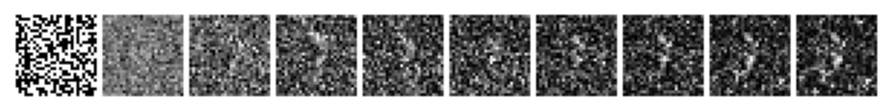

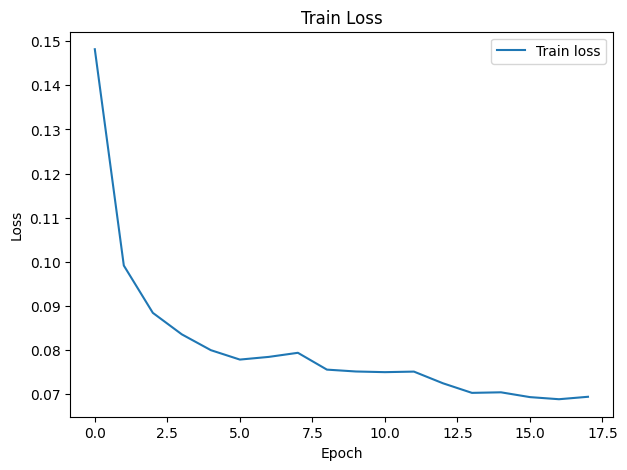

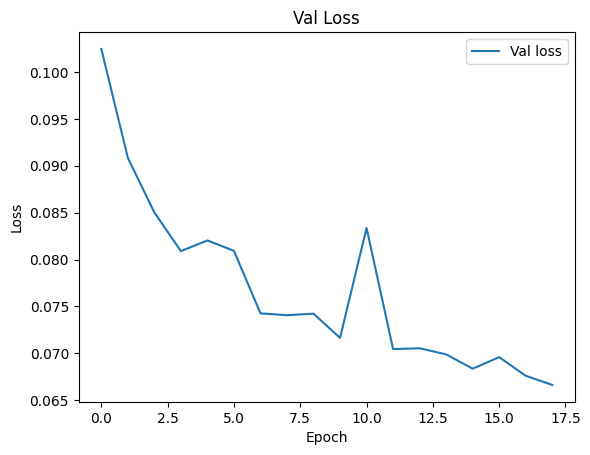

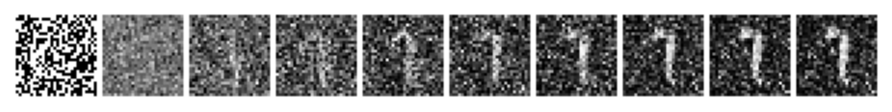

Training Epoch [19/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 3.8893514461815357
ot : 48056.07208251953
Epoch 18 | Loss: 0.06834658472637335 
Save model


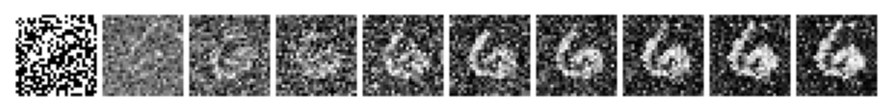

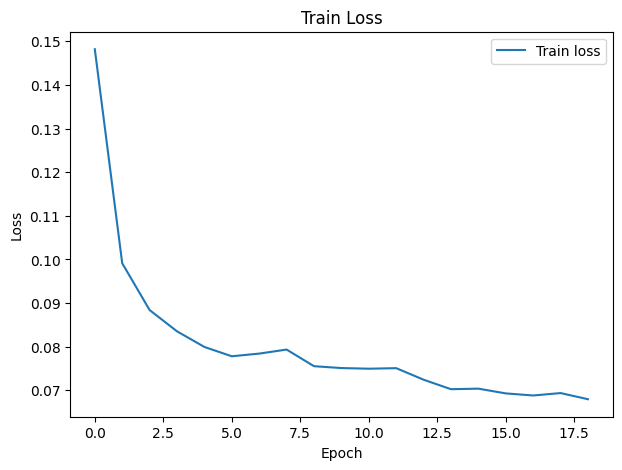

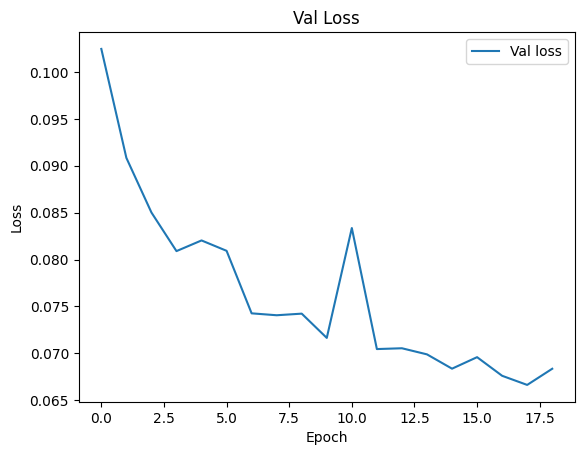

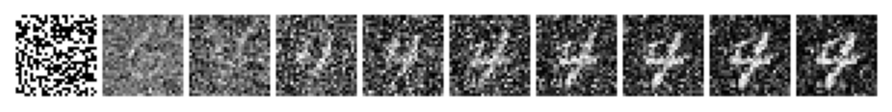

Training Epoch [20/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 3.7816197238862514
ot : 50770.10235595703
Epoch 19 | Loss: 0.0680092665969867 
Save model


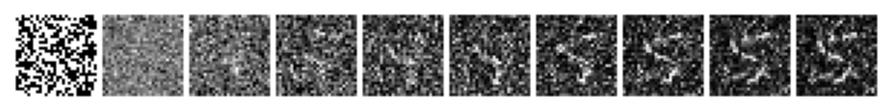

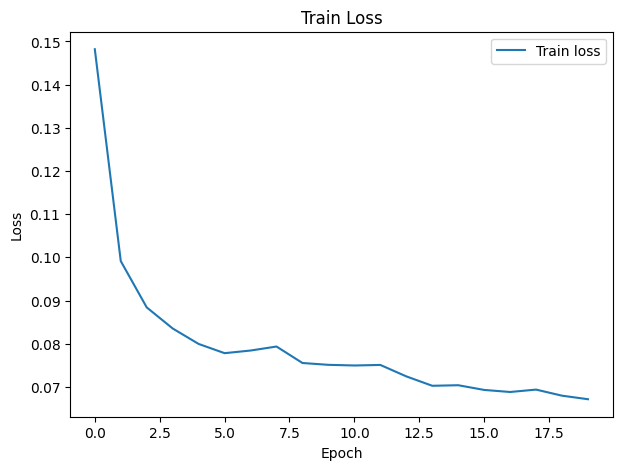

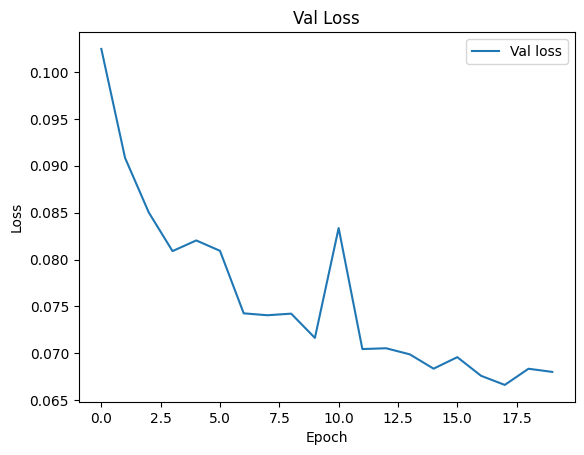

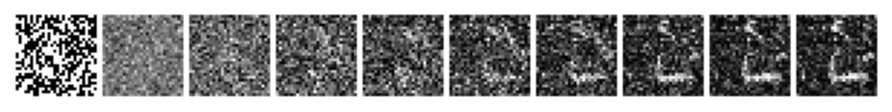

Training Epoch [21/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 3.682988788932562
ot : 48099.92303466797
Epoch 20 | Loss: 0.06571777538426413 
Save model


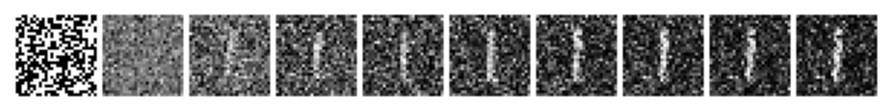

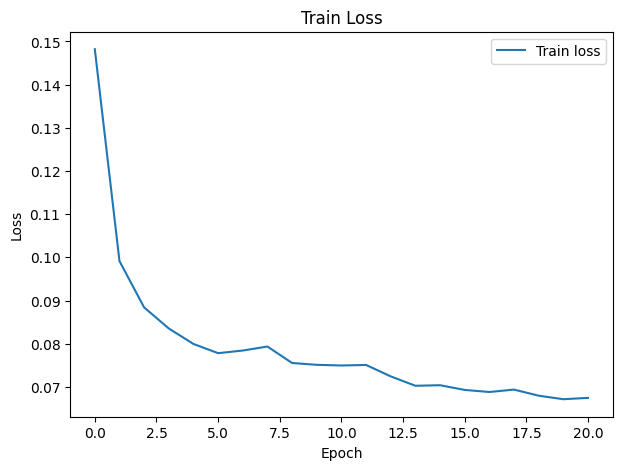

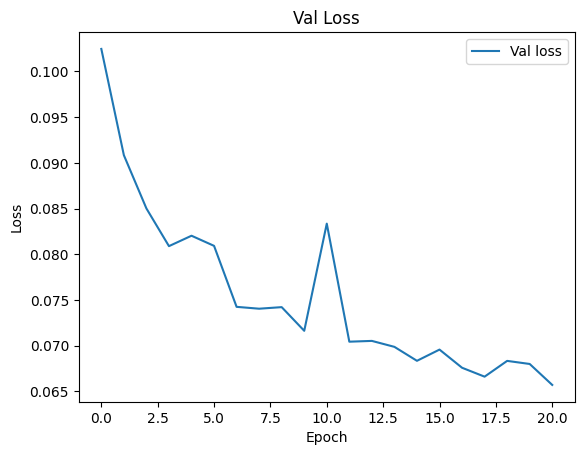

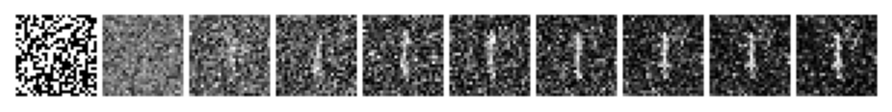

Training Epoch [22/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 3.7016799189150333
ot : 48177.621520996094
Epoch 21 | Loss: 0.06598728928903738 
Save model


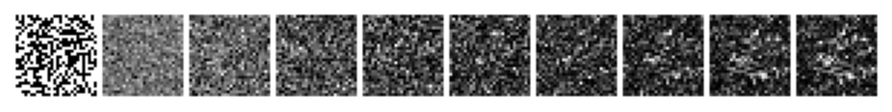

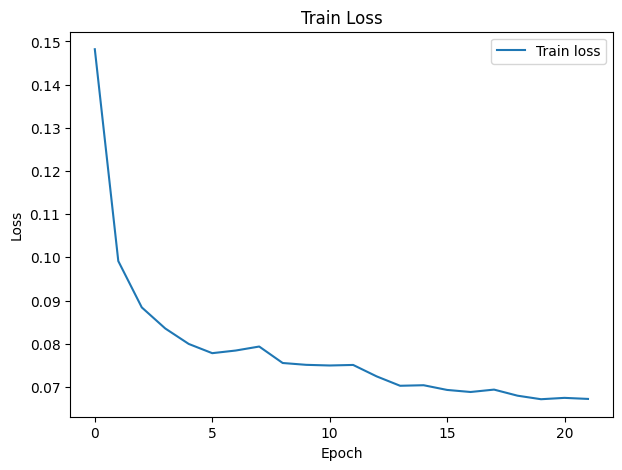

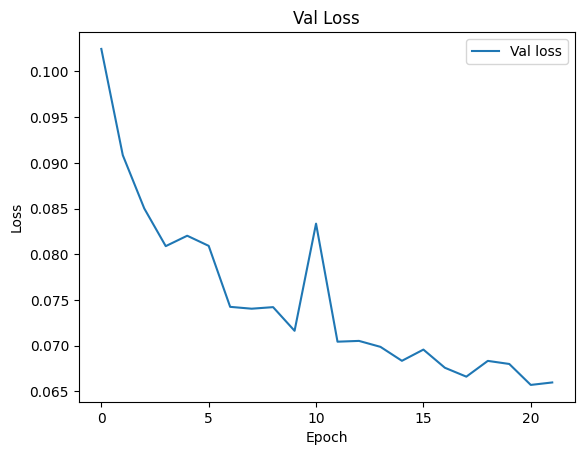

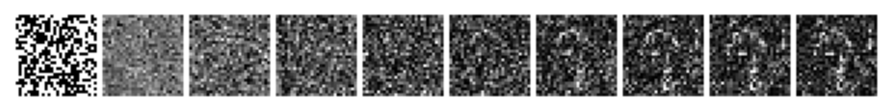

Training Epoch [23/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 3.661542009562254
ot : 49472.647705078125
Epoch 22 | Loss: 0.06597078770146919 
Save model


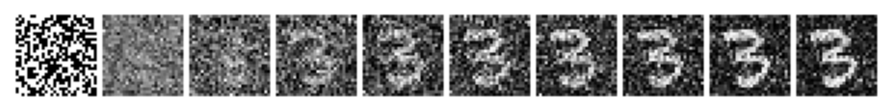

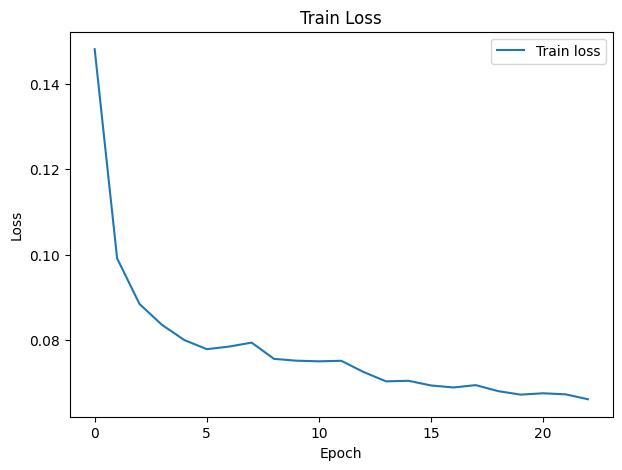

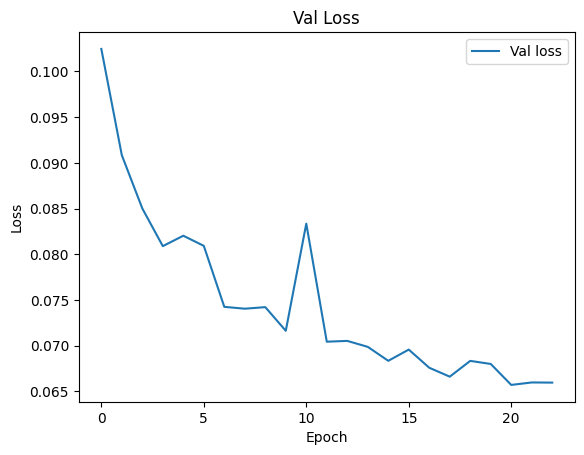

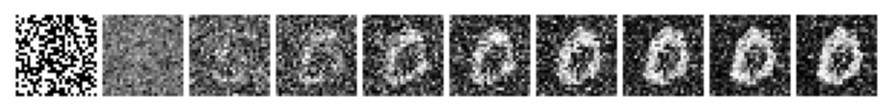

Training Epoch [24/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 3.8114681132137775
ot : 49082.19989013672
Epoch 23 | Loss: 0.06774274499894717 
Save model


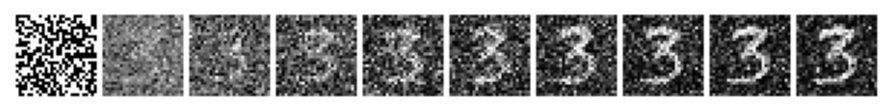

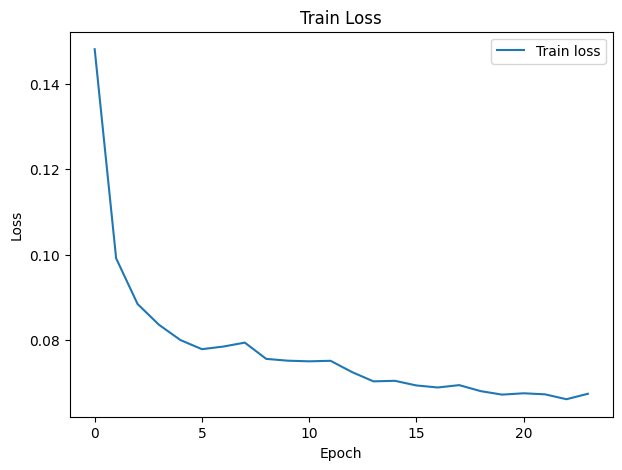

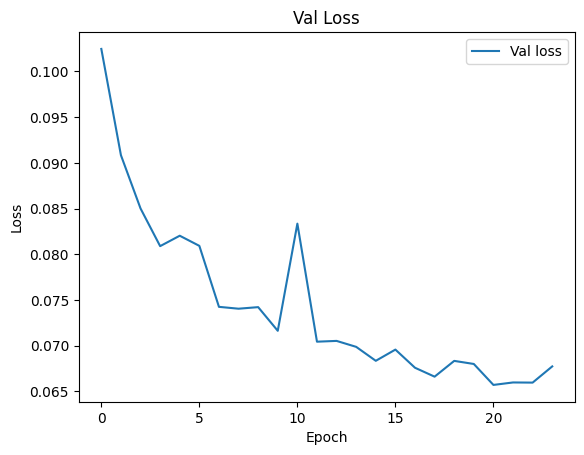

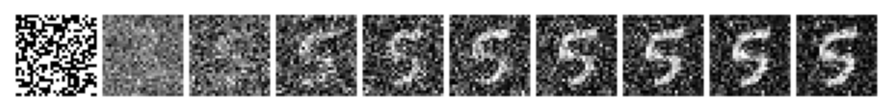

Training Epoch [25/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 3.620889373123646
ot : 48219.32189941406
Epoch 24 | Loss: 0.06496755166802651 
Save model


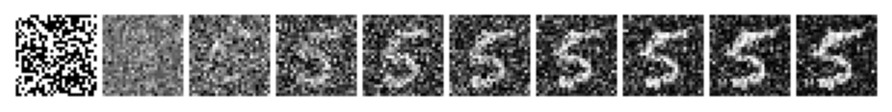

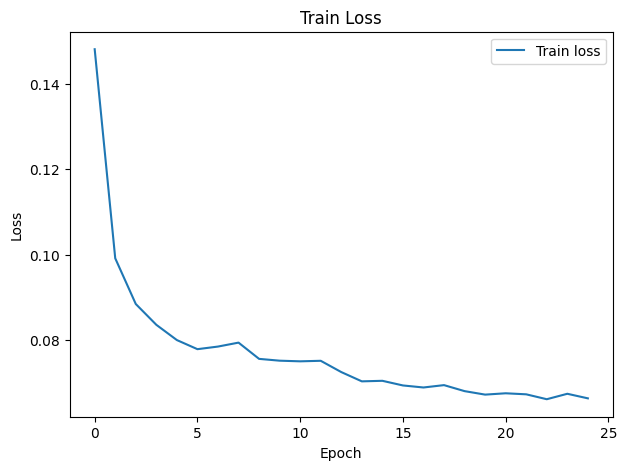

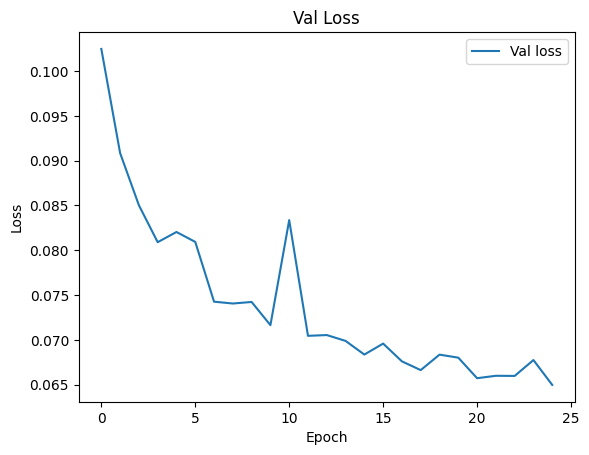

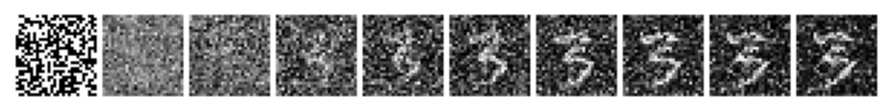

Training Epoch [26/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 3.6302668787539005
ot : 48750.248291015625
Epoch 25 | Loss: 0.06529197855749191 
Save model


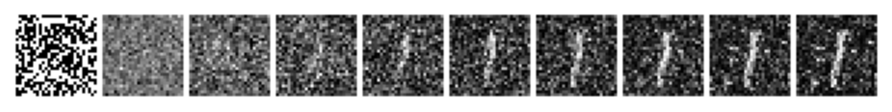

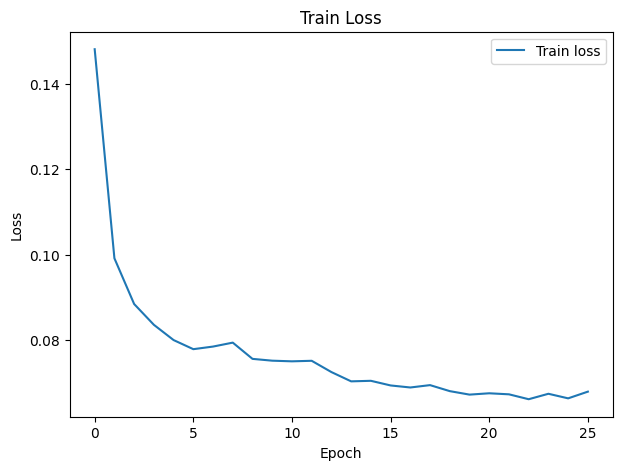

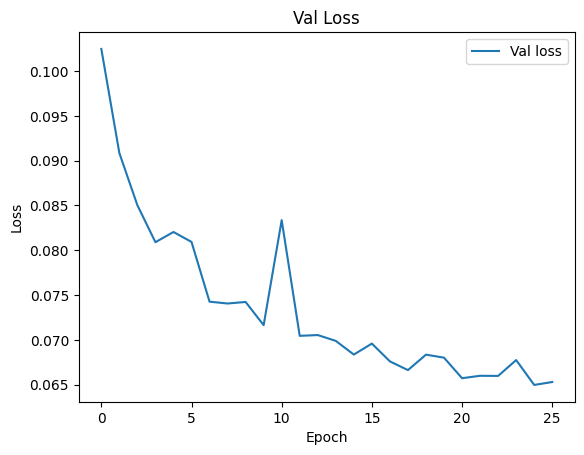

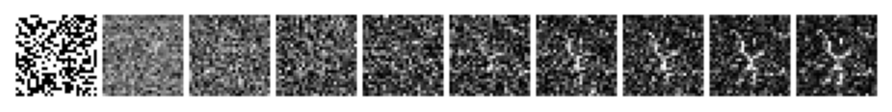

Training Epoch [27/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 3.6390991620719433
ot : 48215.02453613281
Epoch 26 | Loss: 0.06519935766866573 
Save model


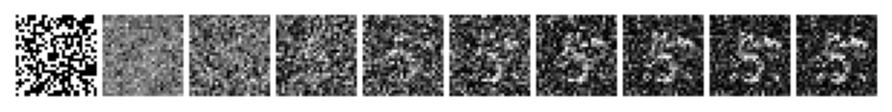

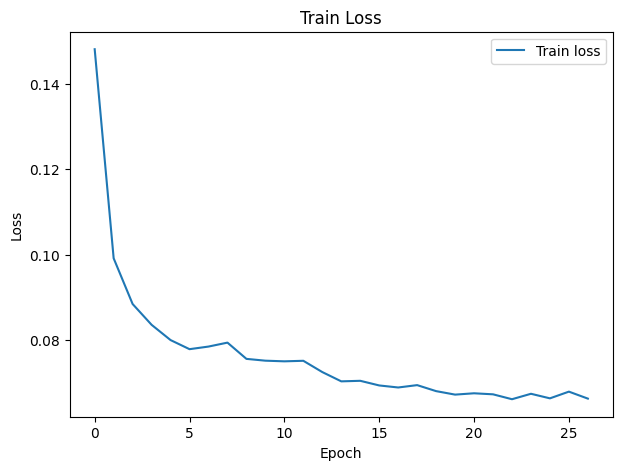

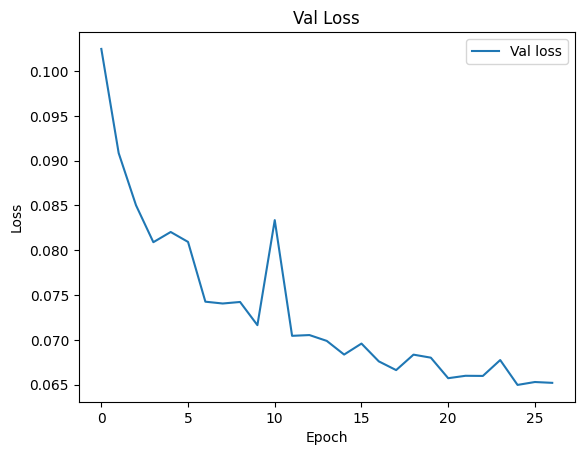

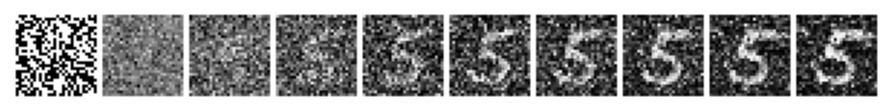

Training Epoch [28/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 3.5733665339648724
ot : 49601.578186035156
Epoch 27 | Loss: 0.0648899215326401 
Save model


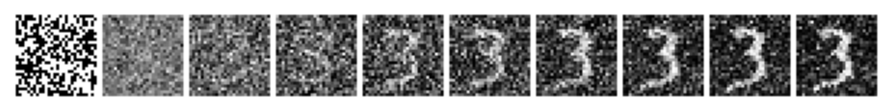

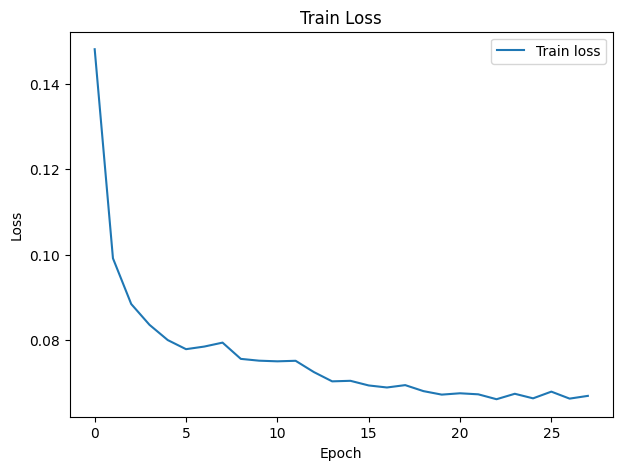

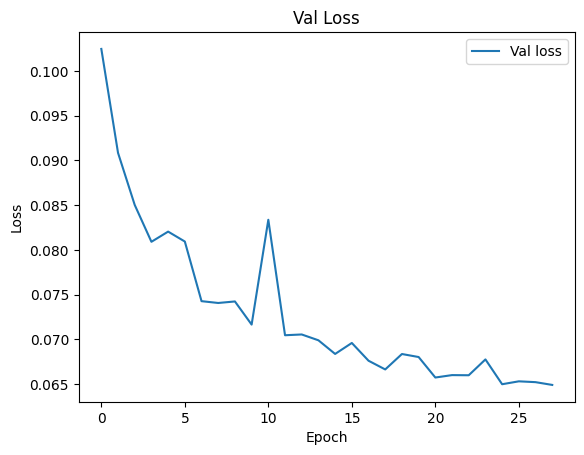

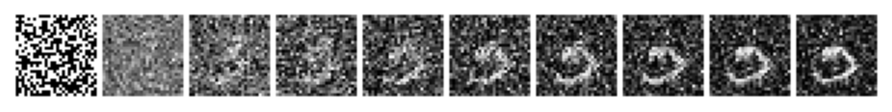

Training Epoch [29/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 3.5824699103832245
ot : 47763.35119628906
Epoch 28 | Loss: 0.06429962110604996 
Save model


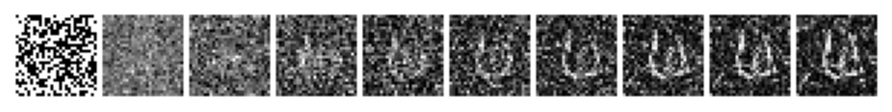

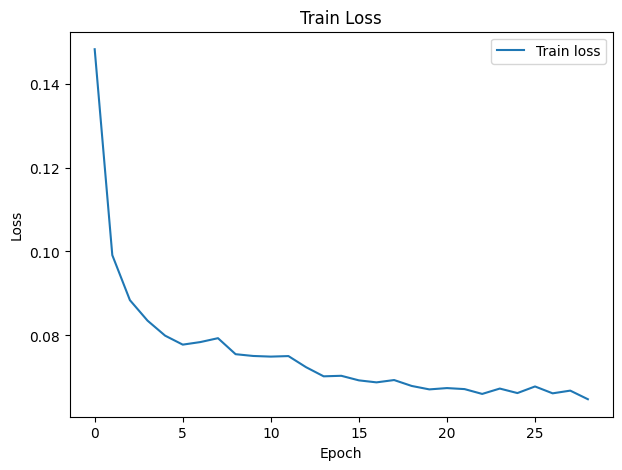

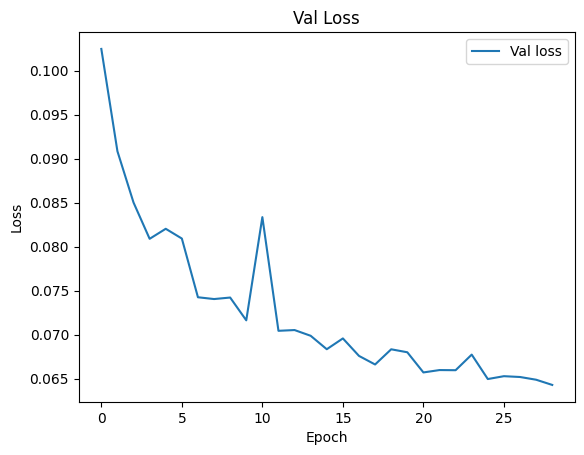

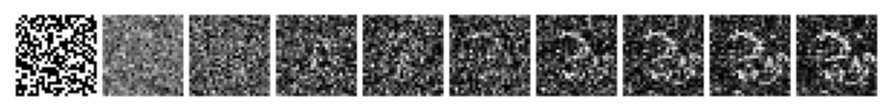

Training Epoch [30/30]:   0%|          | 0/390 [00:00<?, ?it/s]

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 3.5796205289661884
ot : 48790.459899902344
Epoch 29 | Loss: 0.06465813238414435 
Save model


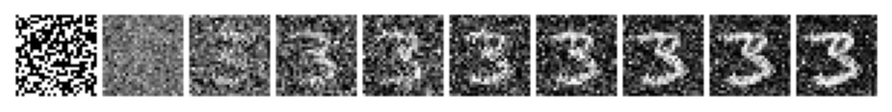

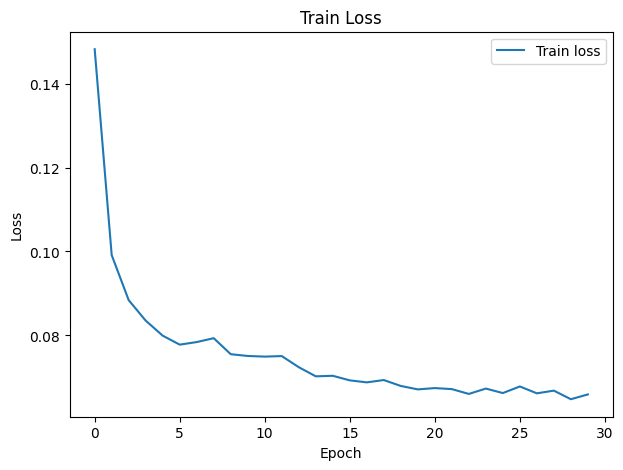

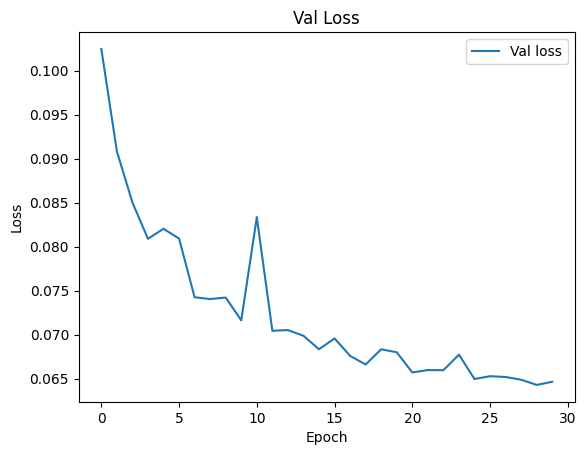

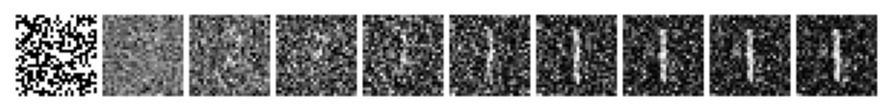

  0%|          | 0/78 [00:00<?, ?it/s]

mse : 3.564786598086357
ot : 52405.054931640625
Final test loss: 0.06585818264148174


In [12]:
from IPython.display import clear_output

train_losses = []

# Training loop
for epoch in range(epochs):
    model.train()
    epoch_loss = 0

    for imgs, _ in tqdm(train_loader, leave=False, desc=f"Training Epoch [{epoch+1}/{epochs}]"):
        imgs = imgs.to(device)
        optimizer.zero_grad()
        loss = model.training_step(imgs)
        loss.backward()
        epoch_loss += loss.item()
        optimizer.step()

    train_losses.append(epoch_loss / len(train_loader))

    # Validation loop
    val_loss = model.validation_step(val_loader)

    if epoch % 1 == 0:
        print(f"Epoch {epoch} | Loss: {val_loss} ")
        torch.save(model.state_dict(), os.path.join(DIR_MODEL, f"{epoch}.pth"))
        print("Save model")
        sampled_data = model.sample(skip=100)
        show_imgs(sampled_data)



    # update plot
    plt.figure(figsize=(7, 5))
    plt.plot(train_losses, label="Train loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Train Loss")
    plt.legend()
    plt.show()

    plt.plot(model.logs['val_loss'], label="Val loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Val Loss")
    plt.legend()
    plt.show()

    # sample
    sampled_data = model.sample(skip=100)
    show_imgs(sampled_data)

# Test loop
model.eval()

final_loss = model.test_step(test_loader)
print(f"Final test loss: {final_loss}")



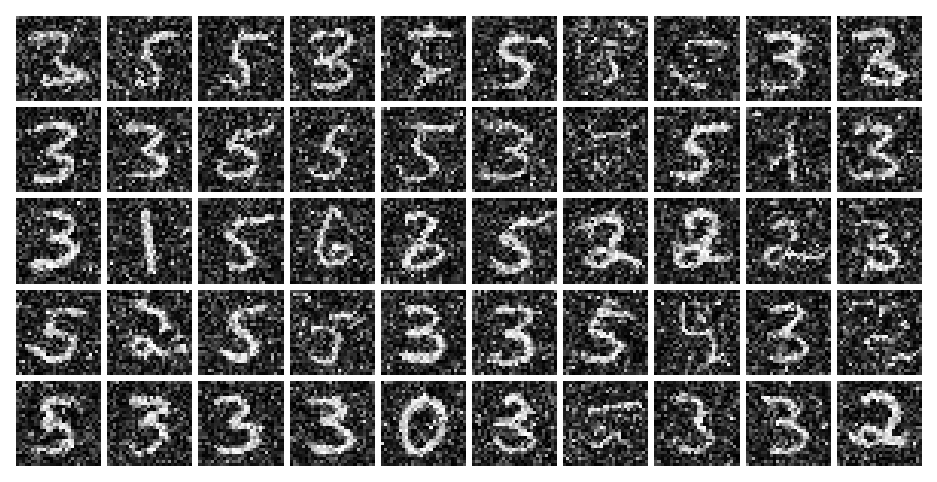

In [13]:
# Assuming sampled_data is a batch of 50 images
sampled_data = model.sample(num_imgs=50, skip=100)[-1]
show_imgs(sampled_data, nrows=5)

In [14]:
from geomloss import SamplesLoss
from math import sqrt
import random
reg = 0.1
loss_fn = SamplesLoss(
                "sinkhorn",
                p=2,
                blur=sqrt(reg),
                debias=False,
                backend="tensorized"
            )
sample = model.sample(num_imgs=1000, skip=100)[-1]
_, feat_sample = netEncoder(sample)
print("done sampling from model")

dataset = train_loader.dataset
indices = random.sample(range(len(dataset)), 1000)
train = [dataset[i][0] for i in indices]
train = torch.stack(train).to(device)
_, feat_train = netEncoder(train)

print(loss_fn(feat_sample, feat_train))

dataset = test_loader.dataset
indices = random.sample(range(len(dataset)), 1000)
test = [dataset[i][0] for i in indices]
test = torch.stack(test).to(device)
_, feat_test = netEncoder(test)

print(loss_fn(feat_sample, feat_test))
print(loss_fn(feat_train, feat_test))

done sampling from model
tensor(2269.9851, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(2438.6450, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(388.2331, device='cuda:0', grad_fn=<SelectBackward0>)
